In [110]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

# setting seaborn style
sns.set()

from sklearn.model_selection import train_test_split

pd.set_option('display.max_rows', None)  # Show all rows
pd.set_option('display.max_colwidth', None) #Show all columns


In [111]:
train_data = pd.read_csv("project_data/train_data.csv", low_memory=False)
test_data = pd.read_csv("project_data/test_data.csv")

In [112]:
test_data.columns.values

array(['Accident Date', 'Age at Injury', 'Alternative Dispute Resolution',
       'Assembly Date', 'Attorney/Representative', 'Average Weekly Wage',
       'Birth Year', 'C-2 Date', 'C-3 Date', 'Carrier Name',
       'Carrier Type', 'Claim Identifier', 'County of Injury',
       'COVID-19 Indicator', 'District Name', 'First Hearing Date',
       'Gender', 'IME-4 Count', 'Industry Code',
       'Industry Code Description', 'Medical Fee Region',
       'OIICS Nature of Injury Description', 'WCIO Cause of Injury Code',
       'WCIO Cause of Injury Description', 'WCIO Nature of Injury Code',
       'WCIO Nature of Injury Description', 'WCIO Part Of Body Code',
       'WCIO Part Of Body Description', 'Zip Code',
       'Number of Dependents'], dtype=object)

In [113]:
# set "Claim Identifier" as the index for the train and test datasets
train_data = train_data.set_index("Claim Identifier")
test_data = test_data.set_index("Claim Identifier")

In [114]:
train_data.duplicated().sum()
train_data.drop_duplicates(inplace=True)

In [115]:
missing_data_target = train_data[train_data['Claim Injury Type'].isna()]
missing_data_target.head()

,Accident Date,Age at Injury,Alternative Dispute Resolution,Assembly Date,Attorney/Representative,Average Weekly Wage,Birth Year,C-2 Date,C-3 Date,Carrier Name,...,WCIO Cause of Injury Code,WCIO Cause of Injury Description,WCIO Nature of Injury Code,WCIO Nature of Injury Description,WCIO Part Of Body Code,WCIO Part Of Body Description,Zip Code,Agreement Reached,WCB Decision,Number of Dependents
Claim Identifier,,,,,,,,,,,,,,,,,,,,,
957648180,NaN,NaN,NaN,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
653337074,NaN,NaN,NaN,2020-01-02,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
489154817,NaN,NaN,NaN,2020-01-03,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
351928125,NaN,NaN,NaN,2020-01-04,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
454184427,NaN,NaN,NaN,2020-01-05,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [116]:
train_data= train_data.drop(missing_data_target.index)

In [117]:
missing_values = train_data.isnull().sum().sort_values(ascending=False)
print(missing_values)

OIICS Nature of Injury Description    574025
IME-4 Count                           441222
First Hearing Date                    423228
C-3 Date                              386781
Birth Year                             29078
Average Weekly Wage                    28651
Zip Code                               28637
WCIO Part Of Body Code                 17081
WCIO Part Of Body Description          17081
WCIO Nature of Injury Description      15656
WCIO Nature of Injury Code             15656
WCIO Cause of Injury Description       15639
WCIO Cause of Injury Code              15639
C-2 Date                               14559
Industry Code                           9957
Industry Code Description               9957
Accident Date                           3688
Medical Fee Region                         0
Agreement Reached                          0
WCB Decision                               0
Gender                                     0
Age at Injury                              0
District N

In [118]:
missing_percentage = ((train_data.isnull().sum() / len(train_data)) * 100).sort_values(ascending=False)
print(missing_percentage)

OIICS Nature of Injury Description    100.000000
IME-4 Count                            76.864596
First Hearing Date                     73.729890
C-3 Date                               67.380515
Birth Year                              5.065633
Average Weekly Wage                     4.991246
Zip Code                                4.988807
WCIO Part Of Body Code                  2.975654
WCIO Part Of Body Description           2.975654
WCIO Nature of Injury Description       2.727407
WCIO Nature of Injury Code              2.727407
WCIO Cause of Injury Description        2.724446
WCIO Cause of Injury Code               2.724446
C-2 Date                                2.536301
Industry Code                           1.734593
Industry Code Description               1.734593
Accident Date                           0.642481
Medical Fee Region                      0.000000
Agreement Reached                       0.000000
WCB Decision                            0.000000
Gender              

In [119]:
train_data =train_data.drop(['OIICS Nature of Injury Description'], axis=1)

In [120]:
WCIO_columns = [
    'WCIO Part Of Body Code', 
    'WCIO Part Of Body Description', 
    'WCIO Nature of Injury Description', 
    'WCIO Nature of Injury Code', 
    'WCIO Cause of Injury Description', 
    'WCIO Cause of Injury Code'
]

# Display rows where all WCIO columns contain NaN values
WCIO_nan_rows = train_data[train_data[WCIO_columns].isna().all(axis=1)]

count_all_nan_WCIO = train_data[WCIO_columns].isna().all(axis=1).sum()
print("Rows with all NaN values in WCIO columns:", count_all_nan_WCIO)


# Calculate the percentage of these rows in the whole dataset
percentage_all_nan_WCIO = (count_all_nan_WCIO / len(train_data)) * 100

# Display the result
print(f"Percentage of rows with all NaN values in WCIO columns: {percentage_all_nan_WCIO:.2f}%")


Rows with all NaN values in WCIO columns: 14763
Percentage of rows with all NaN values in WCIO columns: 2.57%


In [121]:
# Dropping rows where all WCIO columns contain NaN values.
train_data = train_data[~train_data[WCIO_columns].isna().all(axis=1)]

In [122]:
for column in train_data.columns:
    unique_values = train_data[column].unique()
    unique_values_num = train_data[column].nunique()
    print(f"Unique values in '{column}':")
    print(unique_values)
    print(f"Number of unique values in '{column}':")
    print(unique_values_num)
    
    print()

Unique values in 'Accident Date':
['2019-12-30' '2019-08-30' '2019-12-06' ... '2000-05-24' '2007-05-01'
 '1980-05-17']
Number of unique values in 'Accident Date':
5151

Unique values in 'Age at Injury':
[ 31.  46.  40.  61.  67.  48.  33.  55.  20.  21.  51.  62.  35.  54.
  32.  34.  38.  30.  36.  39.  44.  56.  29.  60.  49.  50.  18.  58.
  24.  45.  53.  52.  47.  25.  23.  22.  64.  70.  41.  69.  57.  27.
  42.  77.  72.  19.  28.  63.  65.  59.  43.  26.  74.  66.  76.  68.
  37.  16.  71.   0.  82.  75.  17.  78.  73.  89.  85.  84.  81.  87.
  80.  11.  88.  79.  15.  83.  86.  90.   1.  10. 102.  94. 117. 113.
  95.  92. 104.   5.   8.  14. 115. 110.  91.  96.  99.  12.  13.  93.
 101.   7. 111.   9.  97. 112. 109. 100.  98. 114.]
Number of unique values in 'Age at Injury':
108

Unique values in 'Alternative Dispute Resolution':
['N' 'Y']
Number of unique values in 'Alternative Dispute Resolution':
2

Unique values in 'Assembly Date':
['2020-01-01' '2020-01-02' '2020-01-03' 

#### All listed Variables - summary 

1. **Accident Date**: 0.64% NaN and dates (5539 unique values)

2. **Age at Injury**: 0% NaN and no strange values (108 unique values) (there are some values >100)
3. **Alternative Dispute Resolution**: 0% NaN and no strange values (3 unique values)
4. **Assembly Date**: 0% NaN and dates (897 unique values)
5. **Attorney/Representative**: 0% NaN and no strange values (2 unique values)
6. **Average Weekly Wage**: around 5% NaN and a lot of unique values (120024 unique values)
7. **Birth Year**: 5% Nan and one 25081 strange values "0" (Birth Year cannot be 0) (107 unique values - 0 included)
8. **C-2 Date**: 2.5% NaN and dataes (2475 unique values)
9. **C-3 Date**: 67% NaN and dates (1648 unique values)
10. **Carrier Name**: 0% NaN and name of carrier (2046 unique values) 
11. **Carrier Type**: 0% NaN and no strange values (8 unique values)
12. **Claim Injury Type** - target variable
13. **County of Injury**: 0% NaN and there are 1196 "UNKNOWN" values (63 unique values)
14. **COVID-19 Indicator**: 0% NaN and no strange values (2 unique values)
15. **District Name**: 0% NaN and no strange values (8 unique values)
16. **First Hearing Date**: 73.7% NaN and dates (1094 unique values)
17. **Gender**: 0% NaN and male, female, non-binary and unspecified (4 unique values)
18. **IME-4 Count**: 76.9% NaN and no strange values (41 unique values)
19. **Industry Code**: 1.73% NaN and no strange values (24 unique values)
20. **Industry Code Description**: 1.73% NaN and descripion (20 unique values)
21. **Medical Fee Region**: 0% NaN and one strange value 'UK' (33472 such values) other are numbers (4 unique values)
22. **WCIO Cause of Injury Code**: 2.724% NaN and no strange values (77 unique values) 
23. **WCIO Cause of Injury Description**: 2.724% NaN and no strange values (74 unique values)
24. **WCIO Nature of Injury Code**: 2.727% NaN and no strange values (56 unique values)
25. **WCIO Nature of Injury Description**: 2.727% NaN and no strange values (56 unique values)
26. **WCIO Part Of Body Code**: 2.98% NaN and 42011 "-9" values (probably the should be +9) (57 unique values)
27. **WCIO Part Of Body Description**: 2.98% NaN andone strange value: INSUFFICIENT INFO TO PROPERLY IDENTIFY - UNCLASSIFIED (54 unique values)
28. **Zip Code**: 4.98% NaN and zip code is a bit strange -> it has a lot of unique values, some zip codes starts with numbers and there are som that starts with letters; one zip code unique value is 'UNKNO". According to definition of Zip-Code: zip codes only contain a combination of numeric values.
29. **Agreement Reached**: 0% NaN and no strange values (2 unique values)
30. **WCB Decision**: 0% NaN and only 1 unique value -> variable that should be deleted it is not informative
31. **Number of Dependents**: 0% NaN and no strange values (7 unique values)



### Recommendations to discuss:
* 1 Accident date -> percentage of missing values is very low thus we could drop rows with missing values
* 6 Average Weekly wage -> that variable has a lot of unique values so it is not so informative, think about creating a new variable from that with less categories
* 7 Birth Year -> that variable can be deleted 'cause we have variable age at the injury that does not have any missing value and it gives us same info as birth date
* 8 and 9 C-2/3 Date has a lot of unique values + C3 has a lot of missing values. Maybe it can be change into years only, also so many missing values in C-3 Date maybe states that Data Form C-3 has not been received.It can be also changed into categorical variable 0,1 where 1 means receive and 0 missing value/not received
* 10 and 11: those variables have similar information, but carier type has only 8 unique values so i would keep carrier type and drop carrier name. 
* 16 first hearing date - that variable has a lot of missing values, but those missing values indicates that the claim has not yet had a hearing held (maybe can be change to categorical variable where 1 means that first hearing date was held and 0 means that it has not been yet held) (we would be reduce in that way number of unique values)
* 18 IME-4  count: i would drop that variable since it has so many nan values 
* 19 and 20 either industry code or description should be kept: i would keep industry code
* 21 medical region UK can stands for unknown 
* 22 - 27. WCIO Columns -> we have to decide either to keep code or description: i think code is in general better (so either code or description variables have to be dropped)
* 28 zip code -> i would create divide zip codes per groups e.x one group zip hodes starts with 1, second with 2 etc. But i am not sure what to do with zip codes that strats with letters. After creating those categories we can deal with missing values based on mode in categories.
* 30 WCB Decision -> only one unique value - definetly to drop




In [123]:
# Impute based on industry and region
#train_data['Average Weekly Wage'] = train_data.groupby(['Industry Code', 'Medical Fee Region'])['Average Weekly Wage'].transform(lambda x: x.fillna(x.median()))

# Zip code could be grouped based on country of injury and district name  

In [124]:
# Use Medical Fee Region mode
# train_data['Zip Code'] = train_data.groupby('Medical Fee Region')['Zip Code'].transform(lambda x: x.fillna(x.mode().iloc[0]))

In [125]:
# First Hearing variable actually has some meaning in missing values (how it should be changed?)
# Transforming  'First Hearing Date' to binary variable
train_data['First Hearing Date Binary'] = train_data['First Hearing Date'].notna().astype(int)
print(train_data[['First Hearing Date', 'First Hearing Date Binary']].head())


                 First Hearing Date  First Hearing Date Binary
Claim Identifier                                              
5393875                         NaN                          0
5393091                  2020-02-21                          1
5393889                         NaN                          0
5393887                         NaN                          0
5393863                         NaN                          0


In [126]:
train_data['First Hearing Date Binary'].describe()

count    559262.000000
mean          0.268077
std           0.442958
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           1.000000
Name: First Hearing Date Binary, dtype: float64

In [127]:
# Change all the values indicating that is the missing value to actual NaNs
train_data['Zip Code'].replace('UNKNO', pd.NA)
train_data['WCIO Part Of Body Code'].replace(-9, pd.NA)
train_data['Medical Fee Region'].replace('UK', pd.NA)
train_data['County of Injury'].replace('UNKNOWN',pd.NA)


Claim Identifier
5393875    ST. LAWRENCE
5393091         WYOMING
5393889          ORANGE
5393887        DUTCHESS
5393863         SUFFOLK
5393848        ONONDAGA
5394182        RICHMOND
5393881          MONROE
5394084           KINGS
5394003          ORANGE
5394187        NEW YORK
5393985          QUEENS
5393907     WESTCHESTER
5393838        ONONDAGA
5393826         SUFFOLK
5394012           KINGS
5393811         SUFFOLK
5394026          GREENE
5394109          NASSAU
5393888          ALBANY
5393931           KINGS
5394189          NASSAU
5394080           KINGS
5394160        RICHMOND
5393808            ERIE
5394129        DUTCHESS
5394132           BRONX
5393959           BRONX
5393898          ALBANY
5394183           BRONX
5393857        ONONDAGA
5394112          QUEENS
5393790          CAYUGA
5393984           KINGS
5393791        ONONDAGA
5393823         NIAGARA
5393778      LIVINGSTON
5394027          ALBANY
5393980          NASSAU
5394184           KINGS
5393852            ERIE

In [128]:
# Dropping WCB Decision variable because it only contains one unique value
columns_to_drop = ['WCB Decision', 'IME-4 Count','C-3 Date', 'First Hearing Date']
#columns_to_drop = ['WCB Decision','IME-4 Count','First Hearing Date','C-3 Date','Birth Year']
train_data =train_data.drop(columns_to_drop, axis=1)

In [129]:
missing_percentage = ((train_data.isnull().sum() / len(train_data)) * 100).sort_values(ascending=False)
missing_percentage = missing_percentage[missing_percentage > 0]
print(missing_percentage)

Birth Year                           5.062028
Average Weekly Wage                  4.989254
Zip Code                             4.987644
WCIO Part Of Body Description        0.414475
WCIO Part Of Body Code               0.414475
Accident Date                        0.378356
Industry Code Description            0.259270
Industry Code                        0.259270
WCIO Nature of Injury Description    0.159675
WCIO Nature of Injury Code           0.159675
WCIO Cause of Injury Description     0.156635
WCIO Cause of Injury Code            0.156635
C-2 Date                             0.002682
dtype: float64


In [130]:
# 2.36% sum of percentage of missing values below 1%

In [131]:
train_data["Zip Code"].value_counts().sort_index()

Zip Code
.1605       1
00000      10
00011       1
00601       1
00603       3
00623       2
00624       1
00627       1
00641       1
00656       2
00659       3
00660       1
00662       5
00669       1
00677       4
00678       1
00680       1
00685       1
00692       1
00698       1
00726       1
00727       1
00730       1
00735       1
00737       1
00738       2
00739       1
00749       1
00751       2
00754       1
00757       1
00767       2
00772       1
00775       1
00780       1
00783       1
00791       5
00801       1
00824       2
00857       2
00859       1
00901       1
00912       1
00925       1
00926       1
00927       1
00952       1
00956       1
00962       1
00968       1
00979       2
00982       1
01001       1
01002       4
01007       1
01013       2
01020       1
01027       1
01031       1
01040       3
01056       3
01057       1
01060       3
01062       1
01075       1
01077       1
01083       1
01085       5
01089       2
01096       1
01101      

In [132]:
# Creating new variable zip_code dividied into categories 
def categorize_zip(zip_code):
    if pd.isna(zip_code):  # Check if the value is NaN
        return "Missing"
    elif isinstance(zip_code, str) and zip_code[0].isdigit():
        return zip_code[0]
    else:
        return "Other"


# Apply the function to create the new 'zip_code_cat' column
train_data['zip_code_cat'] = train_data['Zip Code'].apply(categorize_zip)

# If you want to see the distribution of the new category
print(train_data['zip_code_cat'].value_counts())


zip_code_cat
1          505263
Missing     27894
0           17447
3            3459
2            2012
9             760
7             718
4             501
8             437
Other         343
6             239
5             189
Name: count, dtype: int64


<Axes: xlabel='Claim Identifier'>

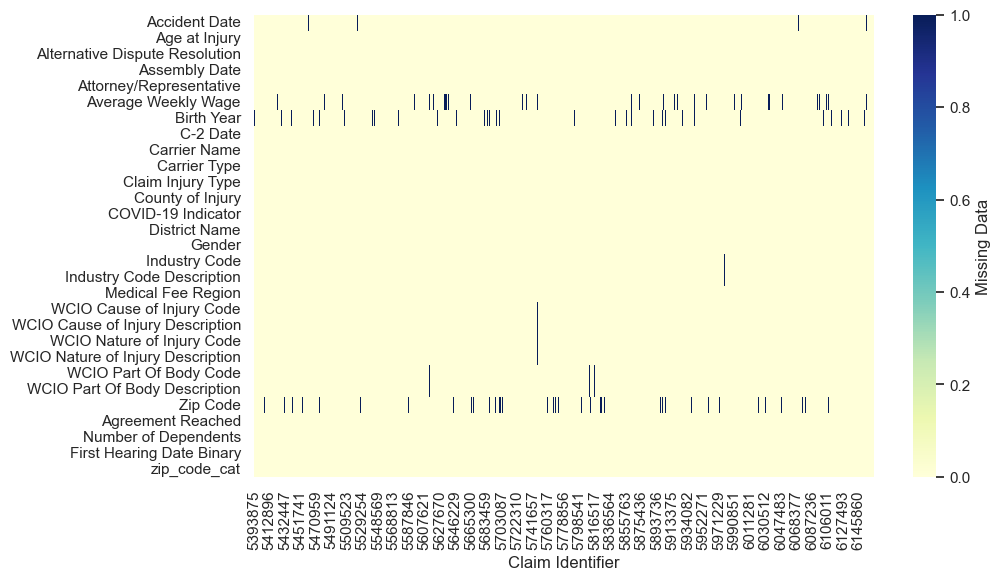

In [133]:
plt.figure(figsize=(10,6))
sns.heatmap(train_data.isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})